In [3]:
from map_util import *

/Users/georgiaessig/Desktop/4444/pps-election/maps/g7/realMap.map


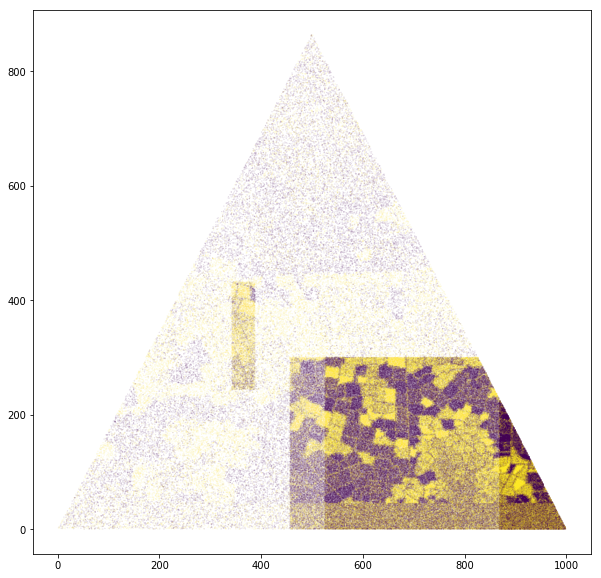

In [4]:
map_list = list_maps()
map_file = map_list[15]
print(map_file)

mmap = load_map(map_file)
visualize_map(mmap)

# Naive Gerrymandering

In [16]:
num_voters, num_parties = mmap.shape[0], mmap.shape[1]-2
num_districts, num_seats = 81, 243
print(num_voters, num_parties)

333333 3


In [17]:
# Enumerate the number of national victories on a completely even election
even_wins = np.bincount(np.argmax(mmap[:,2:], 1)) / num_voters * num_seats
even_count = np.rint(even_wins).astype(int)

In [18]:
def three_vote(vote_counts, return_summary=True):
    """
    Given an array of shape (num_districts, num_parties) with 
    arr[i][j] representing the number of votes the jth party
    received in district i, returns the number of electors each
    party gets in every district (or a summary of the total results)
    """
    # Calculate number of parties
    num_parties = vote_counts.shape[1]
    
    # Calculate vote percentage for each district
    vote_percentage = vote_counts / vote_counts.sum(1)[:,None]
    
    # Enumerate votes for each district
    elected_count = np.zeros_like(vote_counts)
    for i in range(3):
        electors = np.argmax(vote_percentage, 1)
        
        for p in range(num_parties):
            vote_percentage[electors==p, p] -= 0.25
            elected_count[electors==p, p] += 1
    
    return elected_count.sum(0) if return_summary else elected_count

In [19]:
THRESHOLDS = np.array([0, 0.25, 0.50, 0.75])[::-1]
def count_wasted_votes_2(party_votes, total_votes):
    for threshold in np.ceil(total_votes * THRESHOLDS):
        if party_votes >= threshold: break
    
    return party_votes - threshold

In [20]:
# Naive sorting then selecting
voter_list = mmap[mmap[:,1].argsort()]
current_winner = np.argmax(voter_list[:, 2:], 1)

In [21]:
# Uniform district election
uniform_split = np.array_split(current_winner, 81)
uniform_votes = np.array([np.bincount(split, minlength=num_parties) for split in uniform_split])

uniform_wins_1 = 3 * np.bincount(np.argmax(uniform_votes, 1), minlength=num_parties)
uniform_wins_2 = three_vote(uniform_votes)

print("Normal : ", uniform_wins_1)
print("Threes : ", uniform_wins_2)

Normal :  [ 84 159   0]
Threes :  [104 135   4]


In [22]:
d_left = 81
v_left = len(voter_list)

cur_idx = 0
MYPARTY = 0
g_min, g_max = np.ceil(0.91 * v_left/d_left).astype(int), np.floor(1.09 * v_left/d_left).astype(int)
print(f"Allowed range : [{g_min}, {g_max}]")

vote_counts = np.zeros((81, num_parties))
best_y_borders = np.zeros((81,))

total_wasted_votes = 0

for i in range(81):
#     print("Iteration ", i, " voters/districts left = ", v_left, d_left)
    d_left = d_left - 1

    min_voters = max(v_left - (g_max - 1) * d_left, g_min)
    max_voters = min(v_left - (g_min + 1) * d_left, g_max)
    
    # Create cumulative array for party votes and total votes
    party_votes = sum(current_winner[cur_idx:cur_idx+min_voters] == MYPARTY)
    
    party_cumsum = party_votes + np.cumsum(current_winner[cur_idx+min_voters: cur_idx+max_voters] == MYPARTY)
    total_cumsum = min_voters  + np.arange(party_cumsum.shape[0])
    
    # Calculate the closest threshold the party can get
    party_thresholds = np.ceil(total_cumsum[:, None] * THRESHOLDS)

    best_threshold_idx = (party_cumsum[:, None] >= party_thresholds).argmax(1)
    best_threshold = np.choose(best_threshold_idx, party_thresholds.T)

    # Calculate the number of wasted votes for each new voter
    wasted_votes = party_cumsum - best_threshold
    
#     print("Min party vote : ", party_votes)
#     print("Selection range : ", min_voters, max_voters)
#     print("Party cum sum  : ", party_cumsum)
#     print("Best Threshold : ", best_threshold)
#     print("Wasted votes   : ", wasted_votes)

    if i < 80:
        # Best wasted vote index
        best_idx = np.argmin(wasted_votes)

        best_num_voters   = total_cumsum[best_idx]
        best_wasted_votes = wasted_votes[best_idx]
        
        total_wasted_votes += best_wasted_votes
#         print("Best selection : ", best_num_voters, best_wasted_votes)
    else:
        best_num_voters = v_left

    # Accumulate votes
    for p in range(num_parties):
        vote_counts[i, p] = np.sum(current_winner[cur_idx: cur_idx+best_num_voters] == p)
    best_y_borders[i] = voter_list[cur_idx+best_num_voters][1] if i<80 else 500*np.sqrt(3)
    
    cur_idx += best_num_voters
    v_left  -= best_num_voters
    # print()

print(map_file)
print("Greedy : ", three_vote(vote_counts), total_wasted_votes)
print("Even   : ", even_count)
print("Normal : ", uniform_wins_1)
print("Threes : ", uniform_wins_2)

# print(vote_counts[:30])

Allowed range : [3745, 4485]
/home/ps2958/pps-election/maps/g5/coastal3.map
Greedy :  [106. 133.   4.] 33709.0
Even   :  [ 97 117  29]
Normal :  [ 84 159   0]
Threes :  [104 135   4]


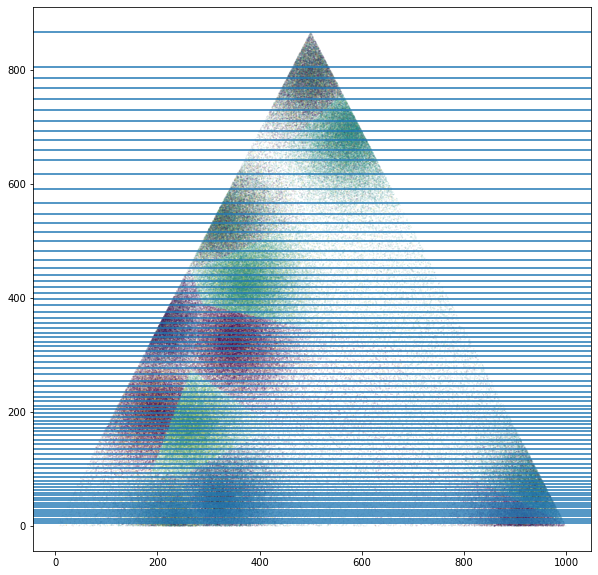

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(10,10))
colors = np.argmax(mmap[:, 2:], 1)

for y_border in best_y_borders:
    ax.axhline(y_border)
    
plot = ax.scatter(mmap[:,0], mmap[:,1], s=0.01, c=colors, alpha=0.5)

In [25]:
prevy = 0
vertices = []
d_rt3 = 1/np.sqrt(3)

for newy in best_y_borders:
    vertices.append([
        prevy*d_rt3, prevy, 1000-prevy*d_rt3, prevy,
        1000-newy*d_rt3, newy,  newy*d_rt3, newy
    ])
    prevy = newy

In [26]:
with open("naive.dat", "w") as handle:
    np.savetxt(handle, mmap, fmt="%f", delimiter=' ', header=f"{num_voters} {num_parties}", comments='')
    np.savetxt(handle, vertices, fmt="4 "+"%f "*8, delimiter=' ', header="81", comments='')

<h1> K-D Tree </h1>

In [6]:
from scipy import spatial

In [14]:
voter_list = mmap[mmap[:,2].argsort()]

d_left = 81
v_left = len(voter_list)

g_min, g_max = np.ceil(0.91 * v_left/d_left).astype(int), np.floor(1.09 * v_left/d_left).astype(int)
print(f"Allowed range : [{g_min}, {g_max}]")

voter_locs = mmap[:,:2]
# make tree out of voter locations, leafsize = (333333 / 81) 
tree = spatial.KDTree(voter_locs, leafsize=4115)

Allowed range : [3745, 4485]


In [16]:

neighbors = tree.query(voter_locs[0::4116], k=4115)
dist, indices = neighbors
print(len(dist), len(indices))

333333
81 81


In [ ]:
for i in range(len(dist)): 
    inds = indices[i]
    dists = dist[i]
    # have 4115 neighbors (I think there's overlap which isn't great)
    neis = [voter_locs[i]for i in inds]
    le
    

[array([498.79681807, 862.88751229]), array([499.06615568, 863.49504196]), array([499.20787722, 863.47898086]), array([498.89041169, 862.15306509]), array([498.66581623, 863.71389597]), array([497.94828019, 862.38047359]), array([500.02975009, 861.86294471]), array([497.5451038 , 861.47550757]), array([500.16102647, 860.48525948]), array([501.6203106 , 863.01778923]), array([497.30097728, 857.61700818]), array([497.60876184, 856.25999817]), array([497.36332846, 856.21424114]), array([504.41197503, 857.71896106]), array([500.78985513, 855.07116456]), array([503.47918612, 854.91929138]), array([494.10892785, 853.10857795]), array([504.23484294, 853.47573454]), array([505.03032742, 853.30115679]), array([496.32900419, 851.58324048]), array([503.70500742, 852.10616282]), array([505.00759824, 852.02439107]), array([505.32680104, 851.99755951]), array([493.12958366, 850.59270898]), array([507.00762482, 851.44102991]), array([502.88407942, 849.35782097]), array([492.43777189, 849.99217132]), 

[array([344.14608388, 312.68361216]), array([344.28871602, 312.69046378]), array([344.60514197, 313.5686585 ]), array([343.12110387, 312.42115937]), array([343.62023987, 313.83166315]), array([344.39061224, 311.42174026]), array([344.2934699 , 311.38454608]), array([344.09698718, 314.06854798]), array([342.76974066, 312.47788497]), array([345.11958781, 313.72441159]), array([344.93891575, 313.99084215]), array([345.55510555, 313.65226201]), array([345.24014932, 311.17919964]), array([344.89853526, 310.98007087]), array([342.59267399, 311.64586416]), array([346.03683632, 312.76556651]), array([343.75037491, 314.67650991]), array([343.52604835, 314.64344661]), array([343.71895942, 314.91843234]), array([346.4195494 , 312.41914019]), array([342.21860701, 314.20340813]), array([346.63493815, 313.42260127]), array([342.16302959, 310.99890646]), array([343.40064348, 310.0088587 ]), array([344.929344  , 315.44082994]), array([346.51387947, 314.33788706]), array([347.04181726, 311.50773719]), 

[array([683.88279284, 281.92570902]), array([684.04622544, 281.89006124]), array([684.20469984, 281.59821961]), array([684.58184513, 281.89475737]), array([683.21241289, 282.35205962]), array([684.19404675, 281.10878735]), array([683.33079546, 282.86146768]), array([684.75857408, 282.60176002]), array([684.46706421, 283.02151529]), array([683.93000899, 280.66035807]), array([685.1870542 , 282.32036319]), array([684.492043  , 283.17660861]), array([684.75069206, 280.82965046]), array([683.06620511, 280.72023764]), array([684.85639072, 280.79944868]), array([685.38905443, 281.94772844]), array([683.63897715, 283.47350256]), array([684.61704444, 283.40782742]), array([685.57301544, 281.46823576]), array([682.43121264, 282.98593965]), array([684.31626022, 283.87561686]), array([681.95259426, 282.65861099]), array([685.94129897, 282.18762389]), array([682.07589504, 280.87051882]), array([685.01407787, 280.14939596]), array([682.01824652, 282.95002395]), array([685.88324781, 281.08687169]), 

[array([523.62157465, 268.56637486]), array([523.95494089, 268.83494245]), array([524.04670716, 268.80405071]), array([523.06808209, 268.95948177]), array([522.85518038, 268.710432  ]), array([523.05248961, 269.35551493]), array([523.98273602, 267.38139678]), array([522.86380262, 267.45051858]), array([524.44056364, 267.39970663]), array([523.37206513, 266.9423023 ]), array([523.79601455, 266.88198158]), array([525.24113908, 269.21762165]), array([524.67281061, 270.1082438 ]), array([522.60882496, 266.79896207]), array([521.54397727, 268.4636581 ]), array([523.81112193, 266.37942269]), array([522.55077049, 266.48960623]), array([525.94712656, 268.20893686]), array([522.12825116, 266.65118759]), array([524.92850845, 270.71078728]), array([520.98204683, 268.28136485]), array([525.53689521, 266.69133982]), array([524.27570591, 271.40750901]), array([525.91727923, 270.4458656 ]), array([521.10774257, 270.18182849]), array([526.61932907, 268.16942681]), array([521.53662012, 266.27295531]), 

[array([694.28164356, 257.93198481]), array([694.0553425 , 257.82046112]), array([694.75231633, 258.03837473]), array([694.93775741, 258.09595706]), array([693.9659606 , 257.11490734]), array([694.39933664, 258.84778295]), array([694.92708507, 258.68082159]), array([694.66774525, 258.94293621]), array([695.03189392, 257.04222445]), array([693.16727778, 258.47373544]), array([693.08376382, 258.26295853]), array([693.47328528, 256.94964993]), array([695.43003052, 258.57103029]), array([694.90155179, 259.14237432]), array([694.39770994, 256.49670036]), array([695.79112715, 258.11149345]), array([692.92247317, 258.63901067]), array([694.99096755, 256.46260614]), array([695.59778353, 258.95169137]), array([692.8540223 , 256.93293339]), array([695.90803746, 257.08489486]), array([693.83682944, 259.72497293]), array([692.73489406, 258.96432803]), array([694.03806102, 256.04856548]), array([693.70505192, 259.75889011]), array([696.20544732, 257.48649852]), array([693.40881456, 256.13137623]), 

[array([816.70196729, 247.4080783 ]), array([816.69443674, 246.93637374]), array([816.56777283, 247.90018121]), array([817.0011518 , 246.86756878]), array([815.92375286, 247.55959299]), array([817.52075366, 247.21689724]), array([817.58176814, 247.4475416 ]), array([817.50511465, 247.83882994]), array([817.6315875 , 247.16372269]), array([817.01613148, 246.450855  ]), array([815.58747025, 246.77717989]), array([815.51225472, 247.89394757]), array([818.01203177, 247.42401969]), array([815.30518229, 247.68731979]), array([815.27609882, 247.28261126]), array([815.34990008, 246.90371781]), array([815.58873399, 248.385139  ]), array([818.16479674, 248.07527951]), array([817.64886394, 248.77454421]), array([817.08675716, 249.12133907]), array([816.62578316, 249.22929395]), array([818.33058273, 248.28878723]), array([816.41867282, 249.27535163]), array([816.08396733, 245.51650591]), array([818.12904304, 246.01311065]), array([815.58375234, 245.73279749]), array([818.64089987, 246.73847412]), 

[array([776.22390217, 222.25897104]), array([776.37772575, 222.24869346]), array([775.96847029, 222.01296818]), array([776.31432525, 221.88727807]), array([775.87564638, 222.67504164]), array([776.68032503, 222.73534718]), array([776.34894468, 223.16209887]), array([775.28055501, 222.17893314]), array([776.89877905, 221.5452958 ]), array([775.52174533, 221.49141589]), array([775.15501775, 222.2513646 ]), array([776.57690355, 221.10185596]), array([776.6601576 , 221.08116069]), array([777.45588442, 221.80679474]), array([776.19563102, 220.8526517 ]), array([777.15078415, 221.12830014]), array([777.13094095, 220.95074647]), array([777.85149617, 222.83728799]), array([775.90791349, 223.99626692]), array([774.48401721, 222.86619628]), array([774.45152085, 221.69500674]), array([778.00287692, 222.84804152]), array([774.34636278, 222.51229197]), array([777.12278859, 220.54868323]), array([778.16583971, 222.753386  ]), array([778.16968473, 222.8251368 ]), array([774.69205889, 223.6839055 ]), 

[array([831.7764588, 210.2215134]), array([832.26596038, 210.31342396]), array([831.12117639, 210.26209096]), array([832.39914705, 210.63985482]), array([831.02525075, 210.47277329]), array([832.30164786, 209.61613893]), array([831.22324996, 209.35653495]), array([832.47675554, 209.42236376]), array([832.5082809 , 211.00689049]), array([833.19852815, 209.66756778]), array([830.65267731, 211.48570295]), array([830.42077703, 209.1235652 ]), array([830.35397256, 211.23260256]), array([830.2111477, 209.3184648]), array([833.48984156, 210.97637357]), array([831.2713569 , 208.30788405]), array([832.44459476, 208.31555035]), array([829.77379748, 209.92076109]), array([833.71079182, 210.90819821]), array([829.97010137, 209.19291263]), array([830.34681852, 208.62231952]), array([833.82026205, 211.04115849]), array([830.32542302, 211.90266443]), array([829.51199857, 210.0436742 ]), array([829.75927094, 209.02776319]), array([830.39254647, 208.25663496]), array([833.15018336, 208.21260864]), arra

[array([658.47659553, 194.60716166]), array([658.914983  , 194.64595827]), array([657.91401296, 194.24289707]), array([659.38590171, 194.65294149]), array([659.20195993, 195.21243995]), array([657.643619  , 194.08222879]), array([659.14091608, 195.48359841]), array([657.94291805, 193.59744833]), array([657.71485584, 193.71326208]), array([659.16696638, 193.51951575]), array([657.20706867, 195.11118553]), array([658.74398135, 196.0084095 ]), array([658.38748907, 196.0815141 ]), array([657.95626933, 193.13255951]), array([657.34596588, 193.47295867]), array([658.06758175, 193.03128294]), array([656.80001588, 193.96426588]), array([659.99647166, 195.60129157]), array([656.6349269 , 194.07069568]), array([659.20993413, 192.82532045]), array([657.23396559, 196.12901865]), array([656.51757216, 194.82051433]), array([656.48223877, 194.37716587]), array([658.73295802, 192.58862947]), array([656.99309222, 196.12564324]), array([660.19746623, 195.96976504]), array([660.37739819, 195.74752795]), 

[array([811.50138514, 179.14519432]), array([811.68046776, 178.78757322]), array([811.80168038, 179.57124295]), array([812.3395762 , 178.71263113]), array([811.76409352, 180.23860816]), array([811.6833239 , 180.29256959]), array([812.08966753, 180.2093951 ]), array([812.56302223, 178.50876169]), array([811.39497158, 180.40281133]), array([810.72881461, 178.13714857]), array([810.77068325, 178.10186662]), array([812.08461307, 177.82232988]), array([811.2996234, 180.6003624]), array([810.19823885, 179.91378706]), array([812.42246023, 177.92265839]), array([811.10007294, 177.65380256]), array([810.1179498 , 178.36271275]), array([810.77954322, 177.7272735 ]), array([813.05652146, 178.5276588 ]), array([809.80293488, 179.13527186]), array([812.4645131 , 177.70888973]), array([813.29557988, 179.03605356]), array([812.34385677, 177.50713531]), array([809.59839356, 178.89769858]), array([809.75933918, 178.32446257]), array([810.54652274, 177.40264357]), array([813.49588557, 179.12482204]), ar

[array([376.12999915, 167.66115432]), array([375.61812611, 167.88854661]), array([375.84585274, 166.43040654]), array([374.96890181, 168.5744954 ]), array([378.06971299, 167.68456266]), array([374.4170637 , 166.45757455]), array([374.24771192, 168.61049162]), array([378.13625742, 165.53305786]), array([377.00762629, 170.55805023]), array([372.80446294, 166.76258599]), array([374.59052566, 164.43564374]), array([373.00870863, 165.20464399]), array([373.41159746, 163.84127204]), array([372.71082172, 163.94998964]), array([375.27294962, 172.91109369]), array([370.32173603, 166.50547587]), array([377.38270995, 161.83994332]), array([371.97501934, 163.29804271]), array([382.23772614, 167.61816668]), array([374.52305805, 174.11366867]), array([375.34732248, 160.82251963]), array([373.46958618, 174.14236719]), array([374.73856134, 174.68157003]), array([376.31707111, 160.47486268]), array([382.96401348, 164.24049393]), array([379.97896766, 174.62337482]), array([381.56567407, 173.77795989]), 

[array([568.44505714, 157.52127169]), array([567.9675555 , 157.12019611]), array([568.29470461, 158.57285698]), array([568.67659527, 156.37945306]), array([569.66833698, 157.36151898]), array([569.6443851 , 157.93732894]), array([569.39874152, 156.6697888 ]), array([567.5035585 , 158.45186377]), array([569.77193091, 157.31124144]), array([569.87517177, 157.33376695]), array([569.86551455, 157.04983853]), array([567.11124976, 156.53386854]), array([567.13413035, 156.46832074]), array([567.43533472, 156.12002012]), array([569.1911057, 159.1081141]), array([567.83819864, 155.86880228]), array([567.8678625 , 159.19856994]), array([570.28482942, 157.47804336]), array([568.26310703, 159.4320267 ]), array([566.54741231, 157.92863166]), array([566.50638824, 158.1379776 ]), array([567.00252657, 158.95848039]), array([570.47044694, 157.75137062]), array([570.47815979, 157.3732837 ]), array([566.89669984, 156.19333058]), array([568.10653361, 155.4761189 ]), array([570.09859102, 156.24512085]), ar

[array([586.18098829, 148.32736745]), array([585.66377735, 148.57423486]), array([586.21635341, 147.73315911]), array([585.58548918, 147.99115563]), array([585.48580609, 148.2659384 ]), array([585.60798818, 147.90184743]), array([585.64173134, 148.87690024]), array([585.52203467, 147.7331739 ]), array([586.97720351, 148.74250099]), array([585.48557836, 148.92857592]), array([586.31014047, 149.39077972]), array([587.00708987, 149.14842104]), array([586.37406447, 147.14432806]), array([585.86900272, 149.50959625]), array([586.3359872 , 146.95384113]), array([586.35926091, 149.90811793]), array([587.87716628, 148.87409946]), array([584.32253776, 148.46231618]), array([585.70190251, 146.50828654]), array([585.8045172 , 150.22732347]), array([584.93872789, 150.01177418]), array([588.30612332, 148.52210929]), array([588.17153446, 147.52015038]), array([584.49223944, 146.93979366]), array([583.96390227, 148.212416  ]), array([587.08205888, 146.25438724]), array([584.3607039 , 146.72208794]), 

[array([692.37119935, 136.42415309]), array([692.45292615, 136.75424107]), array([692.3622996 , 136.77620388]), array([692.60901981, 136.74271737]), array([692.6546105 , 136.73519044]), array([691.87862959, 136.44257539]), array([691.82137822, 136.51003621]), array([692.29182661, 137.06443137]), array([693.06879229, 136.39276846]), array([691.71722162, 137.15663284]), array([692.75923305, 135.3711535 ]), array([691.64589179, 137.38849057]), array([692.10984621, 137.60339881]), array([692.02415082, 135.24884048]), array([692.98495186, 135.24168048]), array([693.68307037, 136.17886228]), array([693.3499039 , 137.48143347]), array([691.36650872, 137.47083725]), array([690.81682827, 136.58474235]), array([693.87848985, 135.75659426]), array([690.69842684, 136.24680434]), array([692.86409895, 138.0912909 ]), array([693.33442625, 137.90589149]), array([692.24333025, 138.20801321]), array([692.18880594, 134.62467642]), array([694.17546549, 137.08937772]), array([692.6706066 , 138.37071981]), 

[array([539.00097568, 126.89611269]), array([538.86228955, 126.9575438 ]), array([538.85831592, 127.1628888 ]), array([539.65609533, 126.93378387]), array([539.60089783, 126.44332779]), array([539.18482835, 127.75508137]), array([538.18726088, 126.52798629]), array([539.83314205, 126.43500845]), array([538.51101081, 127.9354844 ]), array([539.60549232, 125.83489214]), array([539.83008646, 127.79535925]), array([540.25873088, 127.06566133]), array([539.95998179, 127.76926651]), array([540.11236837, 127.63272116]), array([539.50110788, 128.41709713]), array([540.47347707, 127.59158469]), array([540.72680529, 127.25731094]), array([538.2255767 , 125.27849312]), array([537.8859102, 125.4412111]), array([537.37144349, 127.74273496]), array([538.44947159, 125.09249263]), array([537.56255508, 128.188558  ]), array([540.36558791, 125.52540648]), array([537.07688249, 127.38166099]), array([540.00595304, 128.60892088]), array([538.1810656 , 124.99586946]), array([537.02834535, 126.02279265]), ar

[array([829.01407986, 118.04111735]), array([829.04626516, 118.58510673]), array([829.52247321, 118.36597714]), array([829.04353399, 118.67997569]), array([828.88387106, 117.20246837]), array([828.11640847, 117.37010099]), array([828.61827467, 119.10795627]), array([827.76447711, 118.79320355]), array([828.52524163, 119.42114533]), array([827.53253448, 118.09840489]), array([830.02922684, 119.17101071]), array([827.64825676, 118.89865314]), array([827.57293892, 118.8767842 ]), array([830.3288473 , 119.07511792]), array([829.96347294, 116.64040099]), array([830.22088535, 116.61371635]), array([828.612727  , 116.21351885]), array([828.96164216, 119.94625415]), array([828.72408554, 116.12031603]), array([828.35256383, 119.87414664]), array([829.7722727 , 116.21337202]), array([827.59886347, 119.42656744]), array([827.45506407, 119.33107864]), array([828.51185262, 120.02366525]), array([828.8787742 , 115.87660813]), array([829.16526554, 115.74181575]), array([829.13288364, 120.40764903]), 

[array([570.07027872, 108.56085491]), array([569.53863953, 108.80196346]), array([569.30904685, 108.52457664]), array([569.33146883, 108.22622303]), array([570.72326182, 109.06514746]), array([569.31477486, 107.99704978]), array([570.03139893, 107.40412239]), array([569.20795848, 107.71822785]), array([571.25040713, 109.04526461]), array([570.03147871, 109.85485223]), array([570.11094425, 109.87002737]), array([568.82642262, 108.04921365]), array([568.93595545, 107.81387577]), array([571.54373411, 108.71626849]), array([568.95247741, 109.67205872]), array([571.13732544, 109.93076556]), array([569.43999643, 106.9238453 ]), array([570.19619899, 106.79326405]), array([571.68273844, 109.43359183]), array([571.05426402, 107.01212823]), array([571.95007398, 108.8982682 ]), array([568.61992645, 107.25662208]), array([571.73095838, 109.68052729]), array([568.97405271, 110.26062907]), array([570.6315289 , 106.57193736]), array([568.18918912, 109.51088277]), array([571.95027136, 107.5625216 ]), 

[array([779.29648621, 102.25936128]), array([779.3553139 , 102.36971652]), array([778.63445315, 102.37535039]), array([778.60354177, 102.08097107]), array([779.59544958, 102.95529405]), array([778.7688386 , 102.84090233]), array([780.29273891, 102.26803459]), array([779.60155988, 103.20877503]), array([779.40857001, 103.35707569]), array([780.32868122, 101.79217925]), array([780.34735558, 101.77156835]), array([779.93932192, 103.25497031]), array([780.50738186, 102.03169713]), array([779.1589013 , 100.99692074]), array([780.57227918, 102.87989986]), array([778.8677109 , 103.71255805]), array([780.82873627, 102.38936281]), array([778.10601255, 103.32342186]), array([778.22028574, 100.99438212]), array([779.04343551, 103.92160399]), array([778.39724703, 103.73726818]), array([777.64908395, 101.52297971]), array([780.32829143, 100.77811976]), array([778.98880583, 100.47557087]), array([777.76150494, 103.24052345]), array([777.68929029, 101.33641572]), array([777.76420002, 101.20259582]), 

[array([908.79076559,  93.89185657]), array([909.21432963,  93.8371714 ]), array([909.26184736,  93.8345808 ]), array([908.26222182,  93.97573679]), array([909.35236652,  93.57444619]), array([909.4664735 ,  93.93866285]), array([909.10886901,  94.52273782]), array([908.27960969,  94.38105638]), array([909.15294388,  94.55078887]), array([908.27378549,  93.33412384]), array([909.02962038,  94.65940652]), array([907.88146839,  93.92342715]), array([909.6725985 ,  94.34270383]), array([908.37735265,  92.9737947 ]), array([908.68981295,  92.87935632]), array([909.38465539,  94.74075827]), array([909.43878224,  93.06654823]), array([909.66839763,  94.47099055]), array([907.79497532,  93.53656997]), array([908.5229886 ,  94.92978174]), array([907.68251139,  93.85629001]), array([908.4445459 ,  94.95138355]), array([909.73137206,  94.50039232]), array([908.88053746,  92.7681751 ]), array([909.15798884,  94.97319188]), array([909.9692388 ,  94.12232934]), array([907.71711023,  94.43587948]), 

[array([931.75056392,  90.02125297]), array([931.73449667,  90.11155973]), array([931.96462416,  89.80016562]), array([931.85880712,  89.71466105]), array([931.58962396,  89.67191596]), array([931.48595432,  89.52416144]), array([931.70152601,  90.69201135]), array([931.33043283,  89.48101076]), array([932.10637881,  90.60876145]), array([932.02376737,  89.31650267]), array([931.18124425,  89.45898391]), array([931.73951416,  90.82410366]), array([932.32991479,  89.44865589]), array([931.05644831,  89.46864452]), array([931.43799088,  90.86269101]), array([931.51429735,  90.88966535]), array([931.6970768 ,  90.94356131]), array([931.99273991,  89.10861407]), array([931.27333801,  90.89005893]), array([931.63458565,  91.04235324]), array([930.67975989,  90.15092653]), array([932.44230351,  89.17476385]), array([931.25544742,  90.99821393]), array([932.35850156,  89.10486794]), array([932.61731516,  89.32619638]), array([930.65911253,  90.25486306]), array([931.38068299,  91.09089949]), 

[array([947.71725843,  86.89091197]), array([948.01595208,  86.7625978 ]), array([947.47042874,  87.14577377]), array([947.97336323,  86.64488994]), array([948.21976129,  86.57126364]), array([948.3023604 ,  86.72927526]), array([947.11162957,  86.72743426]), array([948.51322229,  86.48707621]), array([948.32796035,  86.12738551]), array([948.64754713,  87.27017369]), array([948.37354272,  86.12610228]), array([947.43466637,  87.90913624]), array([946.72898554,  87.42107953]), array([948.391672  ,  85.96202455]), array([947.77701868,  85.7109017 ]), array([947.2661297 ,  85.79644958]), array([947.42616633,  85.73239928]), array([946.52538245,  86.76306902]), array([947.38580479,  85.72334715]), array([948.07530737,  88.07037483]), array([946.60131425,  86.30206362]), array([947.36665702,  88.20753477]), array([948.03183219,  88.22679404]), array([946.82639066,  85.8206554 ]), array([948.97739289,  87.4954595 ]), array([946.35892034,  87.28074078]), array([948.50929935,  85.68735704]), 

[array([540.21039889,  77.91850824]), array([540.41947126,  78.12040129]), array([540.3193706,  78.2700886]), array([540.64472779,  78.29156745]), array([540.13515749,  77.19564379]), array([541.11909695,  77.92027066]), array([539.42122843,  77.40180916]), array([540.01548326,  76.85509602]), array([539.83691205,  76.87998827]), array([541.09145269,  78.70889452]), array([540.68708593,  76.81712143]), array([540.8599166 ,  78.96767818]), array([541.42175863,  78.21651065]), array([539.26914385,  78.78353517]), array([539.3647577 ,  78.89155139]), array([540.33915454,  76.63460545]), array([539.96752917,  79.27318081]), array([538.89409698,  78.39885948]), array([541.62227978,  78.12788398]), array([539.79301397,  79.41730549]), array([539.52140836,  76.4436639 ]), array([538.88366302,  76.96293155]), array([541.89048494,  77.84228429]), array([538.56903194,  78.3142348 ]), array([541.03953281,  76.4437991 ]), array([538.82629288,  78.89383974]), array([538.64633923,  77.03958408]), ar

[array([544.90921021,  72.68531054]), array([544.74691177,  72.69123924]), array([544.57762008,  72.4947922 ]), array([544.51820569,  72.90966989]), array([544.48031454,  72.88185493]), array([545.42236049,  72.3196944 ]), array([544.8537572 ,  72.04363261]), array([545.56209619,  72.2426446 ]), array([545.25677976,  71.7543535 ]), array([543.91608556,  72.46656066]), array([544.79536952,  73.77349303]), array([543.84280561,  72.95079267]), array([546.04472061,  72.69610721]), array([545.8253936 ,  73.37165231]), array([544.55043441,  73.77854432]), array([544.73907887,  71.53641731]), array([545.74732354,  71.79101904]), array([546.03707743,  72.10905853]), array([546.08479239,  72.15807347]), array([543.61402552,  72.92667132]), array([546.04818972,  71.94636097]), array([546.1044563 ,  73.35538566]), array([544.88387006,  71.20270319]), array([543.44231882,  72.97202538]), array([543.66974394,  71.75208756]), array([543.93516433,  73.90219487]), array([543.65425348,  71.38690431]), 

[array([532.41536834,  66.09391937]), array([532.51499558,  66.1139684 ]), array([532.53593938,  66.20064214]), array([532.21995115,  66.04624453]), array([531.97078321,  66.1659255 ]), array([532.63652709,  65.65980999]), array([532.67568423,  66.5370944 ]), array([531.84361643,  65.9731104 ]), array([531.84928813,  66.39658035]), array([531.97794854,  65.59800926]), array([531.54631869,  65.4061627 ]), array([531.30550151,  66.25274724]), array([531.2914107 ,  65.98258691]), array([532.919864  ,  65.07906347]), array([533.32555035,  66.8141683 ]), array([531.12841802,  66.38142297]), array([531.30943738,  67.07367127]), array([533.20174512,  67.34494892]), array([533.66252248,  65.28402322]), array([533.52118514,  67.2258524 ]), array([532.15842648,  67.74169473]), array([531.81763973,  64.47807842]), array([531.42003701,  67.50476858]), array([530.82297215,  65.20595358]), array([532.50712544,  64.22137038]), array([531.1849575 ,  64.64384613]), array([533.364115  ,  64.44338321]), 

[array([540.32942535,  58.42278351]), array([540.3162368 ,  58.30840517]), array([540.36792718,  58.24166826]), array([540.21838093,  59.01116393]), array([540.67605813,  58.94829738]), array([539.58640145,  58.37637611]), array([540.44712547,  57.54789479]), array([540.87677546,  57.70870565]), array([540.18830985,  59.36978991]), array([539.69688899,  57.59518035]), array([541.46571844,  57.77173754]), array([540.23564686,  57.00537662]), array([539.55462924,  59.74058348]), array([541.5504419,  57.4397722]), array([538.76068347,  58.68989512]), array([541.97616234,  58.42664556]), array([540.85877597,  60.14189653]), array([541.81446023,  57.30126169]), array([539.5861513 ,  60.20576688]), array([539.65892313,  60.25422243]), array([539.84014723,  60.35644178]), array([541.19924103,  60.22525031]), array([539.41237459,  56.62838388]), array([540.34677695,  56.38889205]), array([542.03850217,  57.25539258]), array([542.37507438,  57.75600605]), array([539.76304633,  60.5291697 ]), ar

[array([958.51910757,  53.12008153]), array([958.36012161,  53.06724789]), array([958.91563423,  53.08018194]), array([958.90123772,  52.72064056]), array([959.11006401,  52.97925098]), array([958.71030875,  53.70568875]), array([957.96936099,  52.82794486]), array([958.86375876,  53.73101706]), array([958.97342443,  52.52901908]), array([958.70471771,  52.38258081]), array([958.70970917,  52.36857091]), array([957.9316569 ,  53.66227809]), array([959.29698895,  52.83662488]), array([957.97304274,  52.49677766]), array([957.73150543,  52.51214854]), array([958.34751254,  54.14660467]), array([959.55316072,  53.41674685]), array([959.32215633,  52.33780235]), array([959.01697982,  52.08288087]), array([957.82614597,  54.04774581]), array([959.67716279,  53.24029808]), array([959.56355752,  52.60208288]), array([959.61237823,  53.53456628]), array([958.65915752,  54.29604173]), array([959.30066723,  52.16740597]), array([959.24581908,  52.11271353]), array([959.51133085,  53.89127209]), 

[array([918.403808  ,  44.87782962]), array([918.34767112,  44.81690636]), array([918.39621869,  45.03418284]), array([918.44031161,  45.12922625]), array([918.0775236 ,  44.69990871]), array([917.98052343,  44.72174407]), array([918.57979065,  44.43283727]), array([918.29345218,  45.39177184]), array([918.8151568 ,  44.53536598]), array([918.33757526,  45.46151373]), array([918.83823312,  45.3711993 ]), array([917.90973451,  44.40109169]), array([918.00895458,  45.46065444]), array([917.98442189,  45.49352782]), array([917.65947586,  44.76790049]), array([918.68100352,  45.58242804]), array([918.49287789,  44.1242151 ]), array([918.58410245,  44.09307719]), array([919.15078148,  44.48221784]), array([918.58160868,  45.73533552]), array([918.54892775,  43.92835763]), array([919.12488591,  45.53791542]), array([917.35138487,  44.94014576]), array([917.90201918,  43.91280995]), array([919.55974594,  44.73818854]), array([917.90540634,  46.05222868]), array([917.19356001,  44.42839566]), 

[array([791.07443406,  38.14957   ]), array([790.99762019,  38.10088889]), array([790.8901345 ,  38.05673467]), array([791.39586335,  38.01853661]), array([792.06007563,  38.27360725]), array([791.91364032,  38.912419  ]), array([792.22184803,  38.35753834]), array([789.93526781,  38.44939186]), array([791.70732399,  37.13823856]), array([789.77518088,  38.32024526]), array([791.08007579,  36.67750314]), array([789.84590097,  39.06117042]), array([792.42110187,  37.31387167]), array([791.31385904,  39.75548281]), array([792.64163857,  37.66270666]), array([791.77940673,  39.70533198]), array([791.99638831,  36.70007695]), array([789.46592119,  37.54317534]), array([789.35182839,  38.0971356 ]), array([791.80366212,  39.72047809]), array([790.69711167,  39.91554096]), array([789.74818712,  39.40463799]), array([791.68251391,  36.34435006]), array([792.70124029,  37.13303572]), array([789.66685179,  39.52787375]), array([790.24393305,  36.3541686 ]), array([789.13228699,  37.63435748]), 

[array([605.1108053 ,  29.37447632]), array([604.77674092,  29.04468229]), array([605.21906587,  29.8403287 ]), array([604.76021092,  29.85068867]), array([605.74230192,  28.99722256]), array([605.61690146,  29.99253819]), array([604.40106522,  29.9734954 ]), array([604.02000266,  28.92146593]), array([604.17573651,  28.5926734 ]), array([606.14227599,  30.13599537]), array([605.31209379,  28.1069033 ]), array([606.41852452,  29.84480304]), array([605.00193538,  27.97949514]), array([604.53341089,  28.04143438]), array([606.58133622,  29.12944273]), array([603.64533899,  28.94171298]), array([603.51251891,  29.33641244]), array([604.14811426,  27.99273439]), array([606.89646286,  29.19485669]), array([606.03611809,  30.96801325]), array([603.57314069,  28.31481352]), array([603.21906682,  29.30622473]), array([606.32293884,  27.82607464]), array([606.65772667,  30.63978501]), array([606.11091509,  27.62002792]), array([606.79732418,  30.53168349]), array([607.11096577,  28.90910479]), 

[array([767.75659134,  16.86438605]), array([767.41980701,  16.95962939]), array([768.11631914,  16.83000726]), array([767.18215681,  16.41098258]), array([768.59022389,  16.75637418]), array([768.13848281,  15.99620486]), array([766.95395158,  16.2672316 ]), array([768.11632477,  15.92318879]), array([768.8388919 ,  16.96048182]), array([767.71161029,  17.9721929 ]), array([768.9249281 ,  16.65460752]), array([766.68029624,  17.53752761]), array([766.67665566,  16.13905645]), array([768.44456925,  18.09841118]), array([768.12792684,  18.31985904]), array([766.46765981,  17.63583736]), array([768.89769608,  15.82365358]), array([766.87185594,  18.19057569]), array([766.31153557,  17.67614454]), array([769.23581747,  15.94024217]), array([769.47166124,  16.41068034]), array([769.49388306,  16.46449563]), array([769.54092688,  17.71885177]), array([765.77612145,  17.27821535]), array([765.79423047,  17.39850392]), array([765.73070981,  17.07099143]), array([769.2818306 ,  15.49420395]), 

[array([634.95644191,  13.63095848]), array([635.03636013,  13.84792064]), array([635.51019299,  13.44334289]), array([635.20394392,  14.16408528]), array([634.1740058 ,  13.64306089]), array([634.10379115,  13.43846912]), array([635.09235821,  14.77326156]), array([635.13898117,  12.44203416]), array([634.43654231,  12.50379011]), array([636.07184499,  12.97410042]), array([636.31282687,  13.41795593]), array([635.76341695,  12.49452999]), array([633.98618499,  14.66666471]), array([633.73277835,  14.36247779]), array([633.38048513,  13.44542885]), array([636.51834253,  14.01329854]), array([636.15618923,  12.5291121 ]), array([635.71460428,  12.02814369]), array([636.76834931,  13.68143294]), array([636.29937103,  12.40295371]), array([635.4029433,  15.4360889]), array([633.2034279,  12.9409268]), array([633.04157325,  13.57688062]), array([635.69893397,  11.85055543]), array([636.39993971,  14.92717774]), array([634.34857318,  15.58590636]), array([634.14905335,  11.70068006]), arra

[array([991.00612288,  12.01514589]), array([991.29600648,  11.81965091]), array([990.66415969,  11.92305795]), array([990.65295535,  12.09186721]), array([990.78727347,  12.44559551]), array([991.59259203,  12.02044434]), array([990.3622005 ,  11.83861935]), array([991.66802268,  12.17756236]), array([990.45410929,  11.61443683]), array([990.45623373,  11.60885208]), array([990.35658983,  11.78320184]), array([991.3766562 ,  11.28576968]), array([990.27087192,  11.61179972]), array([991.30866813,  12.94968268]), array([990.99338336,  11.02168099]), array([991.31504735,  11.02706502]), array([991.60348412,  12.89719327]), array([990.65548174,  10.98523829]), array([990.01799495,  12.57457648]), array([992.14882364,  12.0517208 ]), array([990.39467299,  13.00385735]), array([989.86446695,  11.69142142]), array([991.77526718,  11.06499832]), array([991.91319679,  11.08328467]), array([990.88608161,  13.32031963]), array([992.29651524,  11.71772614]), array([991.04209886,  13.35210881]), 

[array([825.4070637 ,   3.80828416]), array([825.35912691,   3.00512987]), array([824.97475389,   4.53246999]), array([826.08052072,   4.42943107]), array([826.26941823,   3.38191223]), array([824.46564214,   4.24357264]), array([824.51011453,   4.55176928]), array([826.28491158,   3.03507951]), array([824.62190561,   4.71589456]), array([826.58392694,   3.4044983 ]), array([825.92194655,   5.05394946]), array([826.75008707,   3.52691287]), array([824.16756084,   4.55118868]), array([824.51027956,   2.59996306]), array([824.09776063,   3.04463695]), array([826.09568877,   2.31636121]), array([826.16682048,   5.40544677]), array([826.85621925,   2.73664029]), array([823.62984038,   4.26226637]), array([826.96205325,   4.87813416]), array([825.37951886,   5.69691298]), array([827.1426904 ,   4.56583044]), array([826.28080608,   2.11318681]), array([827.14140878,   4.62648262]), array([827.34872763,   3.48983409]), array([823.74263205,   2.44102078]), array([823.27975159,   4.60511241]), 

[array([6.34226674e+02, 4.53980214e-02]), array([6.33897790e+02, 2.83797268e-01]), array([6.35057931e+02, 1.18896029e-01]), array([633.57529649,   0.74343506]), array([634.63467505,   0.9173301 ]), array([633.72198207,   0.86560116]), array([634.88837481,   0.86523141]), array([635.15994878,   0.76631198]), array([634.50020581,   1.23223355]), array([6.35379735e+02, 6.01948490e-01]), array([633.95026   ,   1.42551783]), array([635.35918241,   1.08936904]), array([6.32757698e+02, 5.38566111e-01]), array([635.63469445,   0.76051292]), array([634.65590805,   1.69838373]), array([633.54087746,   1.66351731]), array([633.33608132,   1.62950081]), array([633.52757669,   1.75468845]), array([635.50178497,   1.40703221]), array([634.33399521,   1.93777562]), array([635.61493282,   1.39744381]), array([636.15862061,   0.65083197]), array([634.22684554,   2.11023517]), array([6.32183543e+02, 4.84535786e-01]), array([636.1742692 ,   1.06826956]), array([636.19155697,   1.1020596 ]), array([6.3199

[array([664.86189332, 501.32032671]), array([664.26620443, 501.84478594]), array([665.97692038, 500.58661299]), array([665.04404868, 502.72991434]), array([663.4277948 , 502.13740657]), array([663.36134964, 499.22092126]), array([667.81547172, 501.14272254]), array([667.02636795, 499.14402374]), array([661.60442399, 500.68806192]), array([663.25785639, 498.12513509]), array([664.30284436, 497.73210208]), array([666.65533542, 498.06368405]), array([661.47257195, 499.29974726]), array([666.16682679, 505.09545977]), array([661.96631391, 498.31125348]), array([660.83903949, 499.9850175 ]), array([669.22255176, 501.68183055]), array([661.39377743, 504.06717082]), array([661.43087181, 498.20804088]), array([666.15767999, 496.79840332]), array([660.29903911, 499.61858992]), array([669.70046331, 502.07349813]), array([662.04819088, 505.81021002]), array([659.59258475, 502.03980314]), array([663.64096386, 506.63676736]), array([664.56800023, 507.0498501 ]), array([668.29540213, 496.66809624]), 

[array([367.00758484, 154.39393591]), array([366.0213759 , 154.24820216]), array([365.69952841, 155.11004737]), array([368.55229976, 153.83646298]), array([366.93181555, 156.59118617]), array([367.17692921, 152.05334323]), array([364.13358447, 155.51093709]), array([366.02116185, 157.32203719]), array([365.79563929, 150.93900556]), array([362.96525114, 156.91173862]), array([363.26562262, 151.25719   ]), array([371.80990034, 151.84316382]), array([364.05652128, 149.81344291]), array([370.66103005, 158.67645629]), array([361.31804966, 155.64996299]), array([372.53296255, 152.29101138]), array([365.25640498, 160.56118968]), array([363.30770778, 159.64083953]), array([360.33022938, 152.96535051]), array([360.69077251, 151.73889799]), array([369.72010062, 147.95855759]), array([365.54875334, 161.41809745]), array([373.37920646, 158.01790209]), array([364.31783396, 147.57053331]), array([362.73634061, 148.10610204]), array([374.25264723, 152.06515301]), array([367.76808289, 161.9908843 ]), 

[array([517.34341087, 246.74305827]), array([517.3684164 , 245.84956278]), array([516.66537732, 245.9281033 ]), array([516.47730127, 247.43789532]), array([517.45584237, 248.00339646]), array([517.32153652, 245.11855199]), array([518.39540498, 245.40206213]), array([515.52983363, 246.6031658 ]), array([517.34170515, 244.78329003]), array([519.35695956, 246.2603726 ]), array([518.067247  , 244.79350316]), array([518.65546761, 245.11844019]), array([515.52245971, 247.79172974]), array([517.80574848, 248.82526341]), array([515.87813394, 248.49623687]), array([518.95787883, 248.39882439]), array([515.02136029, 247.11930847]), array([516.89739729, 249.05565572]), array([518.07474053, 244.371133  ]), array([517.97939899, 249.20599977]), array([516.43284571, 249.29960209]), array([519.89140633, 247.97156929]), array([516.75988561, 249.63659169]), array([514.62770845, 247.9205546 ]), array([514.4741804 , 247.54885863]), array([520.3516872 , 246.48257977]), array([520.41574031, 247.17937394]), 

[array([415.11201304, 450.05919181]), array([415.83836461, 449.15938019]), array([415.51388592, 452.69517983]), array([417.93781504, 449.87386996]), array([414.99306701, 446.57954477]), array([417.65286996, 447.61040809]), array([415.90920405, 446.11373639]), array([417.75448771, 453.98156177]), array([419.29066881, 452.89223715]), array([416.61309498, 445.21133589]), array([412.27678022, 454.31312545]), array([413.74541602, 455.32425701]), array([413.59144249, 455.28448696]), array([412.15346488, 454.88585147]), array([409.39367178, 452.29832407]), array([420.99109208, 448.10396427]), array([412.13087129, 444.39401459]), array([408.9521317 , 452.22888207]), array([413.59924771, 443.55233554]), array([421.39222006, 452.52758326]), array([414.4354771 , 456.85498111]), array([421.85724072, 451.50588918]), array([408.18447973, 449.13463559]), array([409.56227827, 454.40551492]), array([415.18616168, 457.19619236]), array([414.38775328, 457.25139252]), array([407.88881904, 449.20641971]), 

[array([690.39477562,  89.55722379]), array([690.74834166,  89.79236689]), array([690.87375951,  89.58269146]), array([690.56803644,  90.38827729]), array([691.0554476 ,  89.00494381]), array([689.66392747,  89.05330445]), array([690.27974185,  90.54763017]), array([690.52354483,  88.30902063]), array([689.54946596,  88.57137868]), array([691.08134895,  88.41258698]), array([691.45705034,  88.73308364]), array([691.54195868,  90.32066695]), array([689.45367734,  88.43886989]), array([689.54418426,  90.76138921]), array([689.14909901,  90.38076648]), array([689.91621591,  91.0061725 ]), array([688.8555499 ,  89.95233067]), array([690.52753487,  91.18987609]), array([690.41953638,  91.19524243]), array([688.75137387,  89.8353233 ]), array([690.56147664,  91.40068747]), array([691.86264917,  88.40900861]), array([692.18576748,  88.92221969]), array([690.06159269,  91.43572774]), array([689.39822106,  87.90136543]), array([689.97193565,  87.42173951]), array([692.49632873,  88.94384618]), 

[array([632.03132861,  98.03931484]), array([631.91581792,  97.73651903]), array([632.57808298,  98.14453689]), array([631.78847228,  98.57103303]), array([631.43900945,  97.87646139]), array([632.7946611 ,  97.98019752]), array([631.46999942,  97.44487524]), array([631.99598677,  97.16552644]), array([632.2647299 ,  97.12711816]), array([632.88293397,  98.52927338]), array([632.94774232,  98.6242391 ]), array([631.59405221,  96.93424102]), array([631.31959475,  99.0350834 ]), array([631.04463048,  98.87629993]), array([631.65829751,  99.28334201]), array([632.96071168,  96.99187102]), array([630.8018427 ,  98.73785756]), array([633.40533317,  97.60247303]), array([632.53162435,  99.40658377]), array([630.99087202,  96.80055946]), array([631.66165417,  99.70711509]), array([631.05998385,  99.47173794]), array([632.82318917,  96.34010026]), array([631.76395412,  96.16753954]), array([631.38865004,  99.93845032]), array([634.05139588,  97.72871377]), array([633.0494346 ,  96.26189604]), 